# **Automatic Prediction of MOSFET Threshold Voltage using Machine Learning**
##**Data Processing and Visualisation**

- **Dataset:** MESD (MOSFET Electrical Simulation Dataset) - Loaded from a GitHub repository.
- **Data Loading:** JSON files containing electrical simulation data are loaded.
- **Raw Data Inspection:** Counting and visualizing the raw $I_{\text{D}}$–$V_{\text{G}}$ curves by device type and PDK.
- **Preprocessing:**
  - Extracting $V_{\text{th}}$ using methods like Constant Current.
  - Normalizing $I_{\text{D}}$–$V_{\text{G}}$ curves for consistent input features.
  - Calculating the threshold ratio ($R_{\text{th}}$) as the target variable.
  - Creating a feature matrix with consistent dimensions for ML input.
- **Processed Data Inspection:** Counting and visualizing the preprocessed data samples and normalized curves by device type and PDK.

* * *


In [1]:
import json
import numpy as np
import pandas as pd
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import os
import glob

In [2]:
!git clone https://github.com/SJTU-YONGFU-RESEARCH-GRP/MESD-MOSFET-Electrical-Simulation-Dataset.git

# !ls MESD-MOSFET-Electrical-Simulation-Dataset/MESD


Cloning into 'MESD-MOSFET-Electrical-Simulation-Dataset'...
remote: Enumerating objects: 66, done.
remote: Counting objects: 100% (15/15), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 66 (delta 3), reused 15 (delta 3), pack-reused 51 (from 2)
Receiving objects: 100% (66/66), 51.31 MiB | 10.93 MiB/s, done.
Resolving deltas: 100% (40/40), done.
Updating files: 100% (50/50), done.


## **Load the Dataset**

This section clones the **MESD (MOSFET Electrical Simulation Dataset)** from GitHub, which contains electrical simulation data for various MOSFET devices.

The dataset includes:
- Multiple device types (nMOS, pMOS, FinFET, etc.)
- Different PDKs (Process Design Kits)
- I–V characteristics, i.e., $V_{\text{GS}}$–$I_{\text{D}}$ curves
- Device metadata (temperature, dimensions, etc.)

NOTE : N180A-pmos1.json was skipped here due to faulty data, the curve didn't follow PMOS characteristics

In [3]:
def load_mesd_data():
  data_folder_path = 'MESD-MOSFET-Electrical-Simulation-Dataset/MESD'
  json_files = glob.glob(os.path.join(data_folder_path, "*.json"))
  json_files.sort()
  all_data = []
  for file_path in json_files:
    file_name = os.path.basename(file_path)
    if file_name == "N180A-pmos1.json":
      print(f"Skipping: {file_name}")
      continue
    with open(file_path, 'r') as f:
      data = json.load(f)
      all_data.append(data)
  return all_data

# Load the dataset
mesd_data = load_mesd_data()
print(f"Loaded {len(mesd_data)} JSON files")

Skipping: N180A-pmos1.json
Loaded 43 JSON files


## **Count Raw Records by Device**
Inspecting how many data samples exist for each MOSFET configuration before preprocessing.

In [4]:
def count_raw_records_by_device(mesd_data):
  counts = {}

  total_records = 0
  for device_data in mesd_data:
      device_type = device_data.get('Type', 'unknown')
      pdk = device_data.get('PDK', 'unknown')
      key = (device_type, pdk)

      records_list = device_data.get('Records', [])
      num_records_in_file = len(records_list)

      if key not in counts:
          counts[key] = 0
      counts[key] += num_records_in_file
      total_records += num_records_in_file
  if not counts:
      print("No raw data found in 'mesd_data'.")
      return

  print("Raw Record Counts by Device")
  for (device_type, pdk), count in counts.items():
      print(f"  - {device_type} ({pdk}): {count} records")

  print("---------------------------------")
  print(f"  Total Raw Records: {total_records}")
count_raw_records_by_device(mesd_data)

Raw Record Counts by Device
  - NMOS (N15A): 125 records
  - PMOS (N15A): 125 records
  - NMOS (N180A): 12000 records
  - NMOS (N180B): 21000 records
  - PMOS (N180B): 21000 records
  - NMOS (N350A): 6000 records
  - PMOS (N350A): 6000 records
  - NMOS (N3A): 200 records
  - PMOS (N3A): 200 records
  - NMOS (N40A): 22500 records
  - PMOS (N40A): 22500 records
  - NMOS (N45A): 9000 records
  - PMOS (N45A): 9000 records
  - NMOS (N45B): 27000 records
  - PMOS (N45B): 27000 records
  - NMOS (N55A): 22500 records
  - PMOS (N55A): 22500 records
  - NMOS (N7A): 1800 records
  - PMOS (N7A): 1800 records
  - NMOS (N90A): 27000 records
  - PMOS (N90A): 34500 records
---------------------------------
  Total Raw Records: 293750


## **Plots of Raw $I_D$–$V_G$ Curves**

Visualization of plots of the **drain current ($I_D$)** versus **gate voltage ($V_G$)** characteristics for selected devices in the **MESD dataset**

Found 21 device groups to plot.
Plotting all 125 raw samples for NMOS (N15A)...


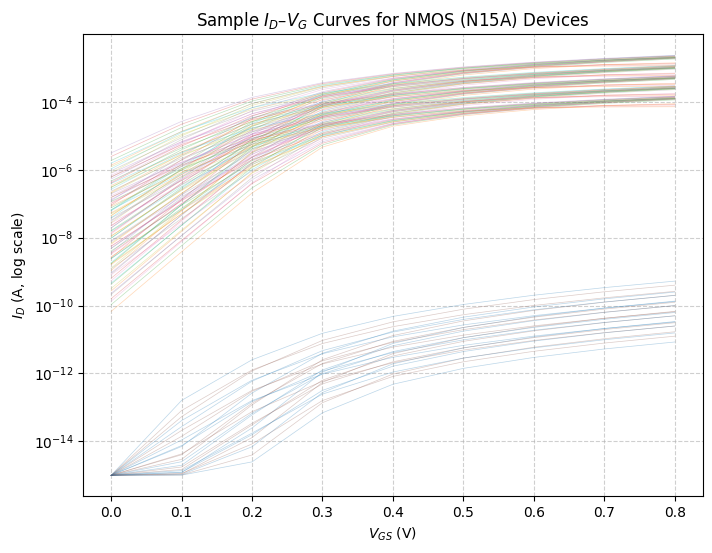

Plotting all 125 raw samples for PMOS (N15A)...


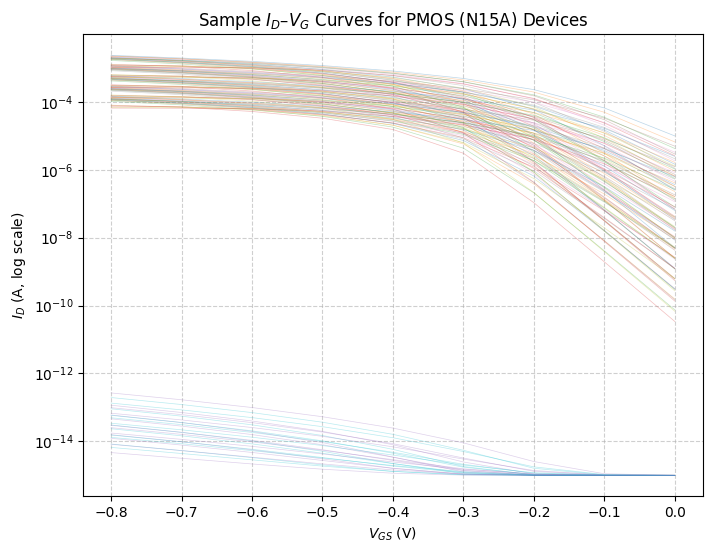

Plotting all 12000 raw samples for NMOS (N180A)...


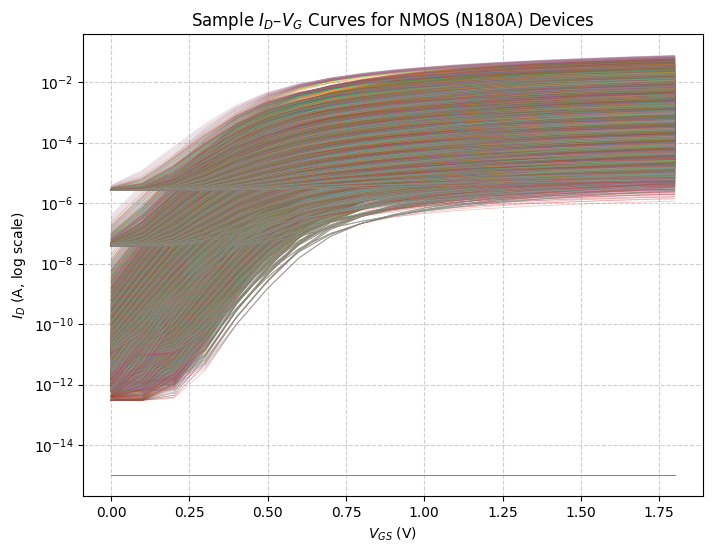

Plotting all 21000 raw samples for NMOS (N180B)...


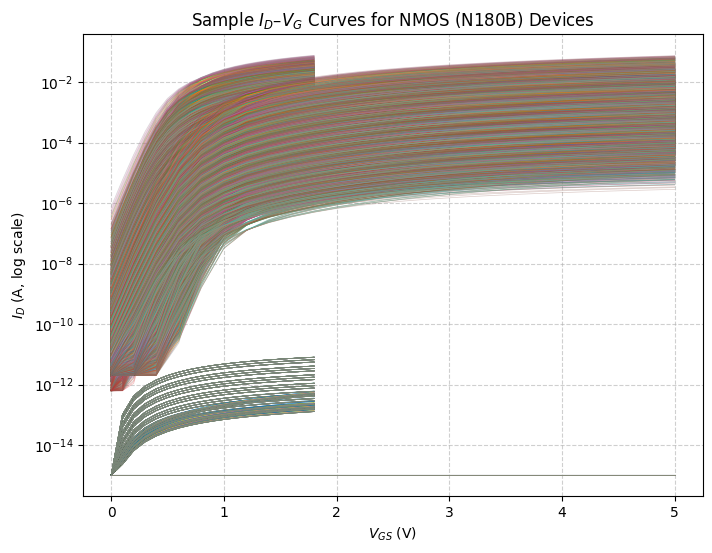

Plotting all 21000 raw samples for PMOS (N180B)...


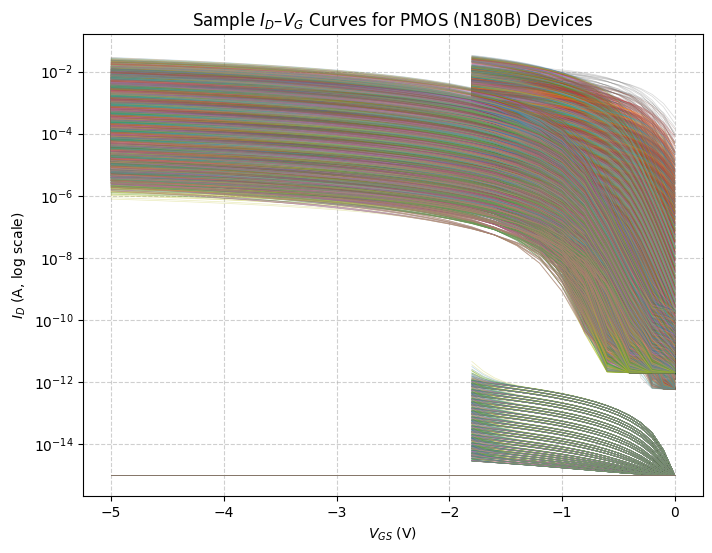

Plotting all 6000 raw samples for NMOS (N350A)...


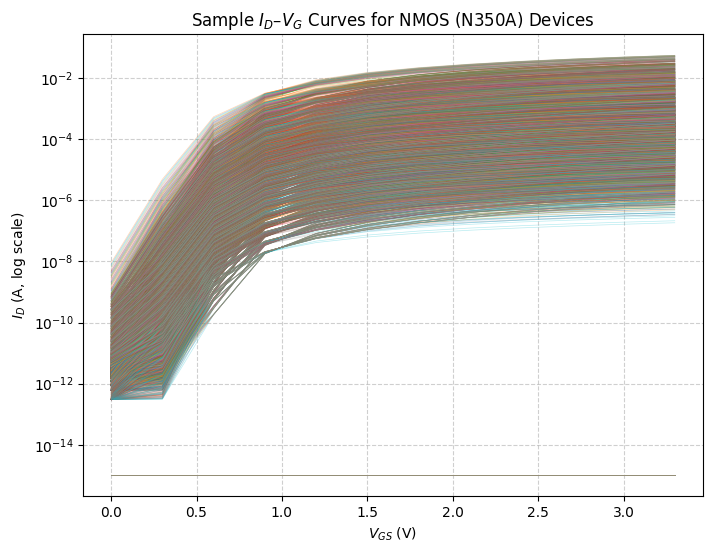

Plotting all 6000 raw samples for PMOS (N350A)...


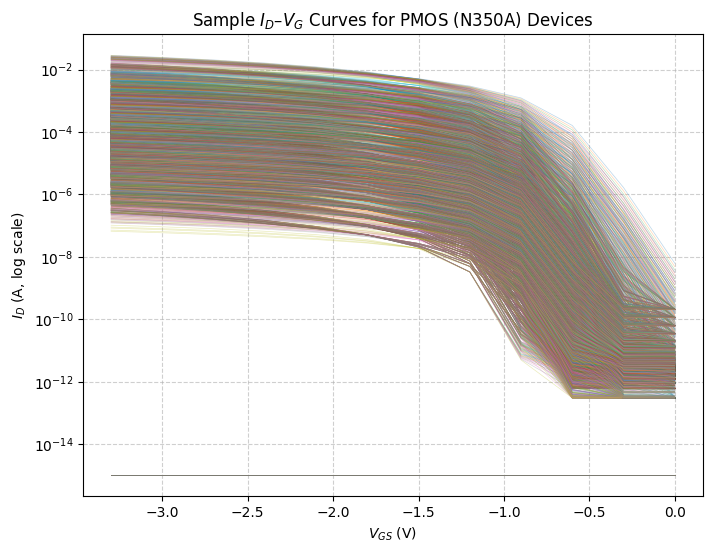

Plotting all 200 raw samples for NMOS (N3A)...


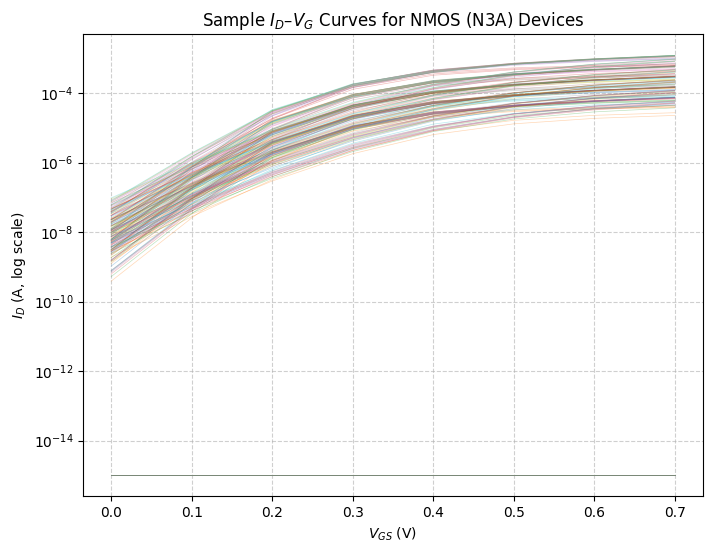

Plotting all 200 raw samples for PMOS (N3A)...


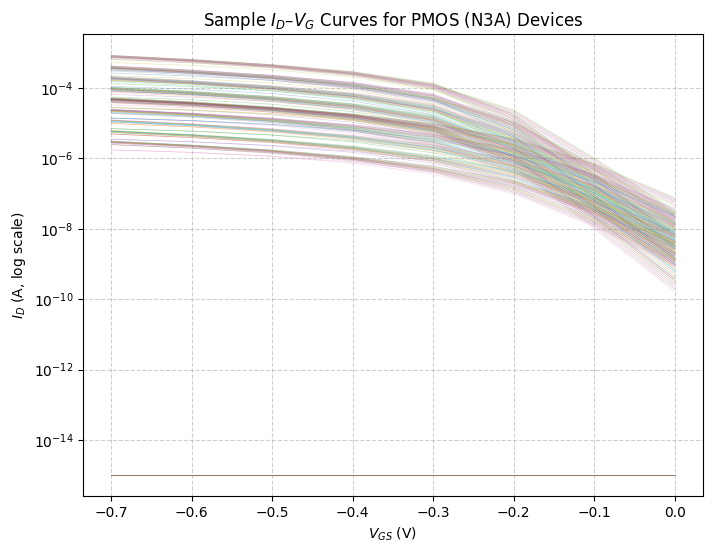

Plotting all 22500 raw samples for NMOS (N40A)...


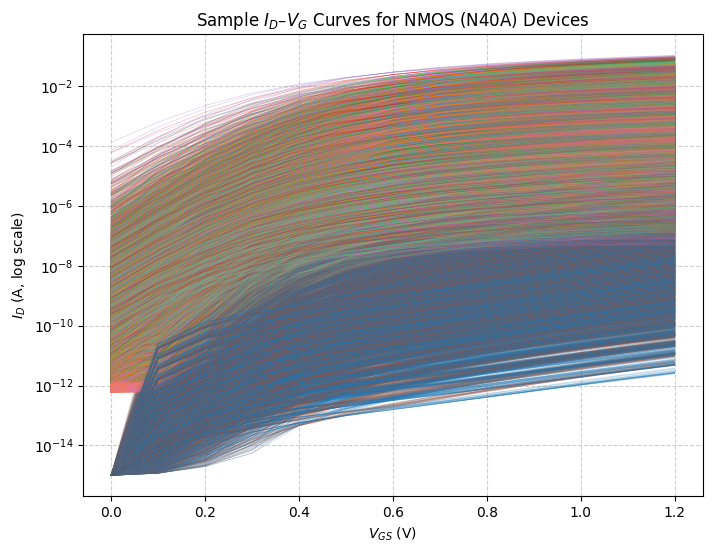

Plotting all 22500 raw samples for PMOS (N40A)...


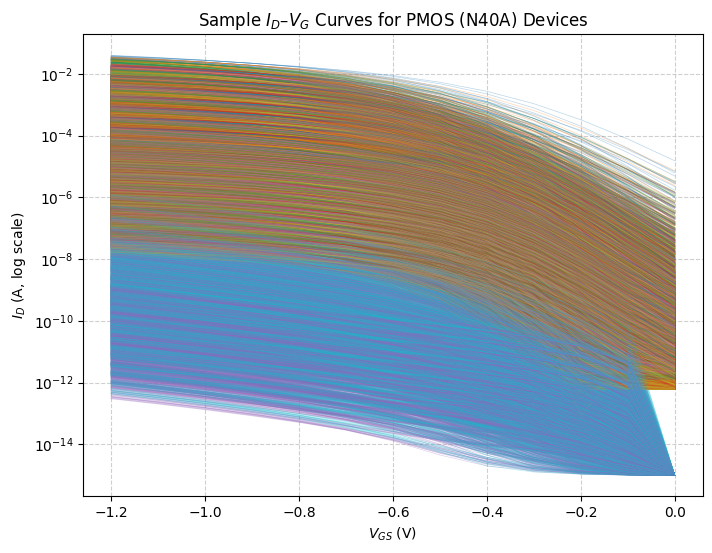

Plotting all 9000 raw samples for NMOS (N45A)...


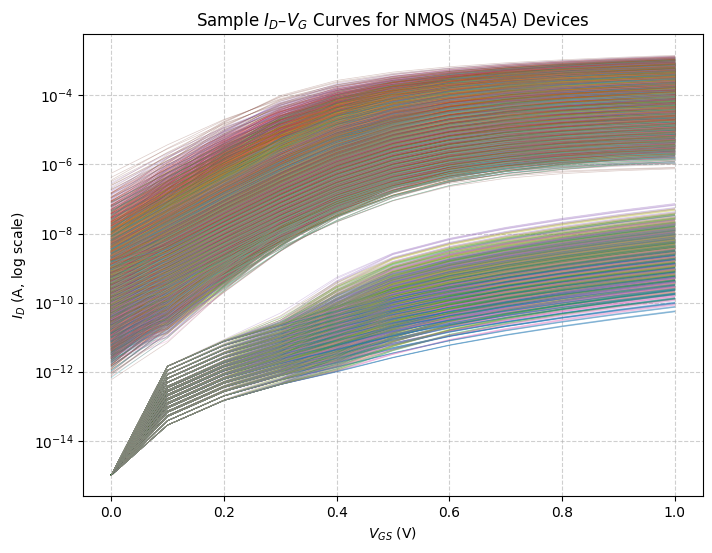

Plotting all 9000 raw samples for PMOS (N45A)...


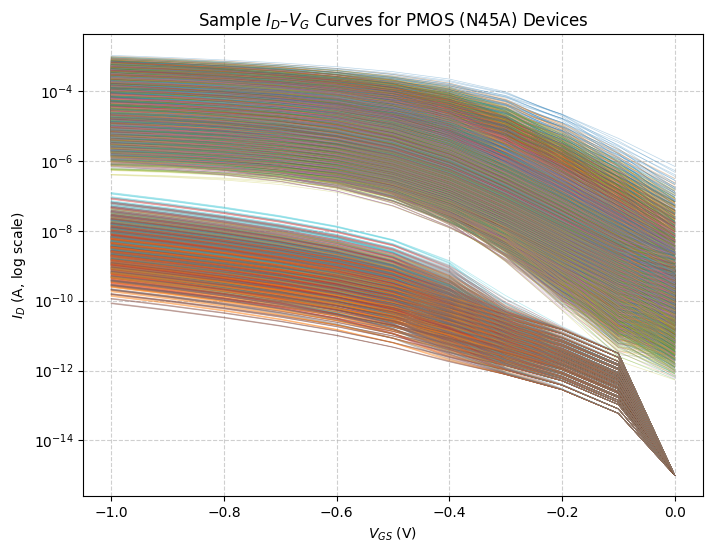

Plotting all 27000 raw samples for NMOS (N45B)...


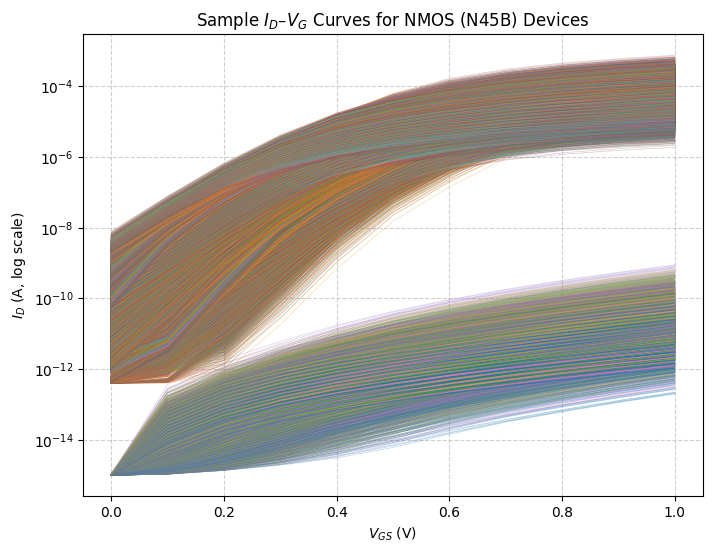

Plotting all 27000 raw samples for PMOS (N45B)...


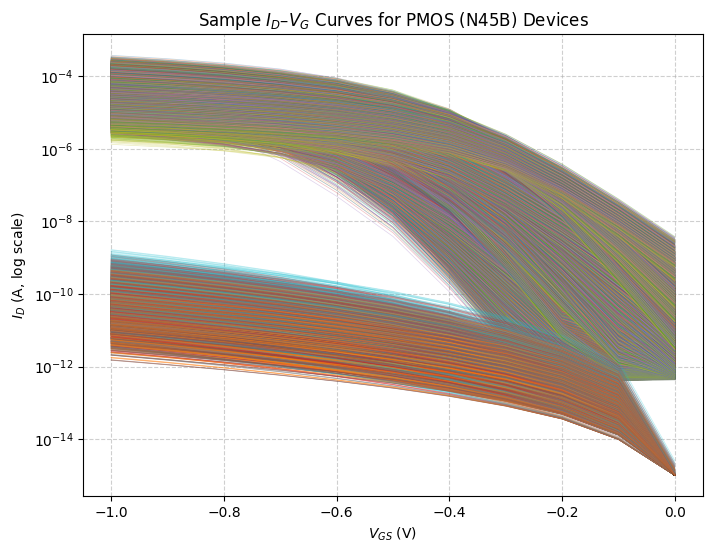

Plotting all 22500 raw samples for NMOS (N55A)...


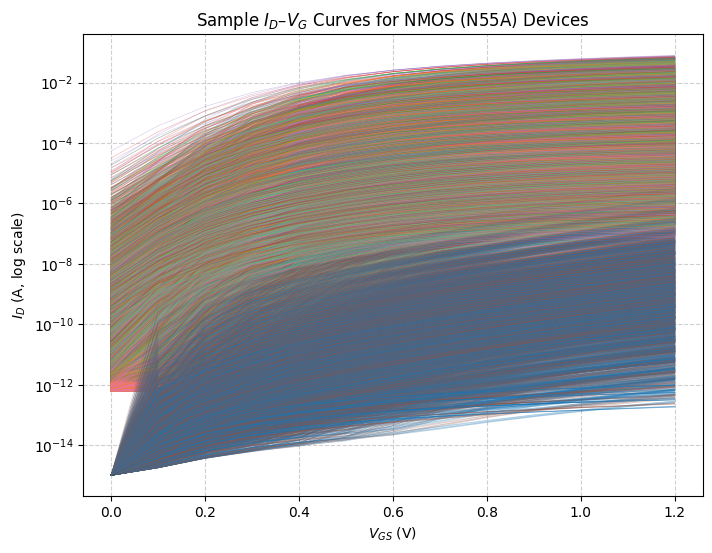

Plotting all 22500 raw samples for PMOS (N55A)...


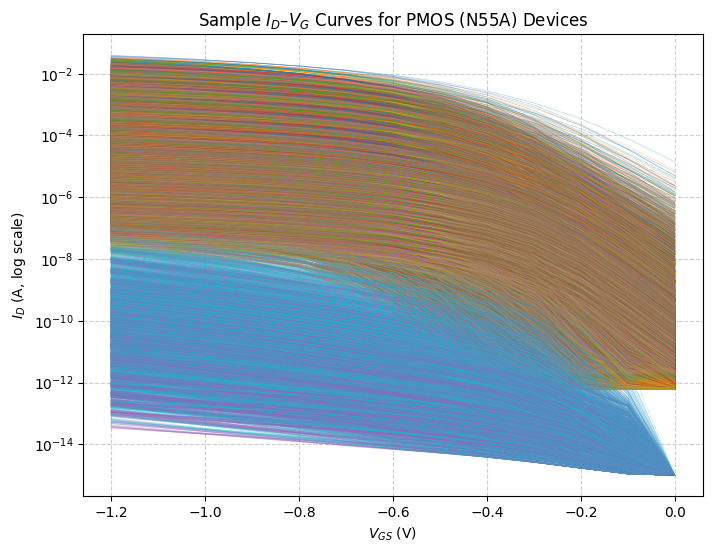

Plotting all 1800 raw samples for NMOS (N7A)...


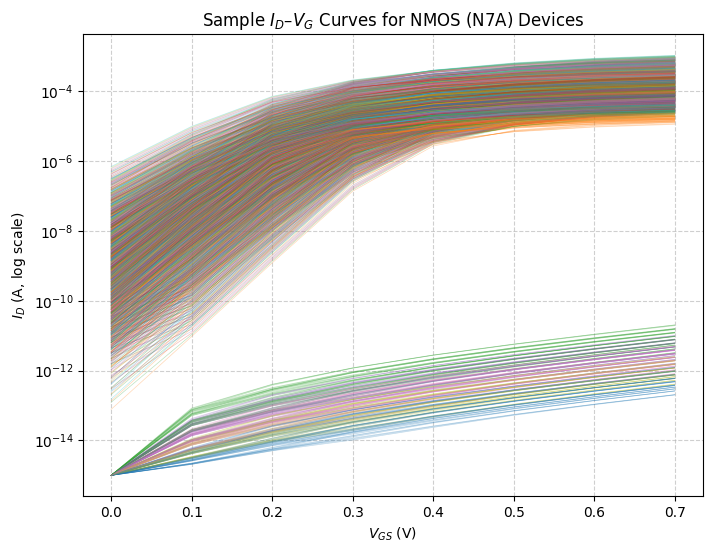

Plotting all 1800 raw samples for PMOS (N7A)...


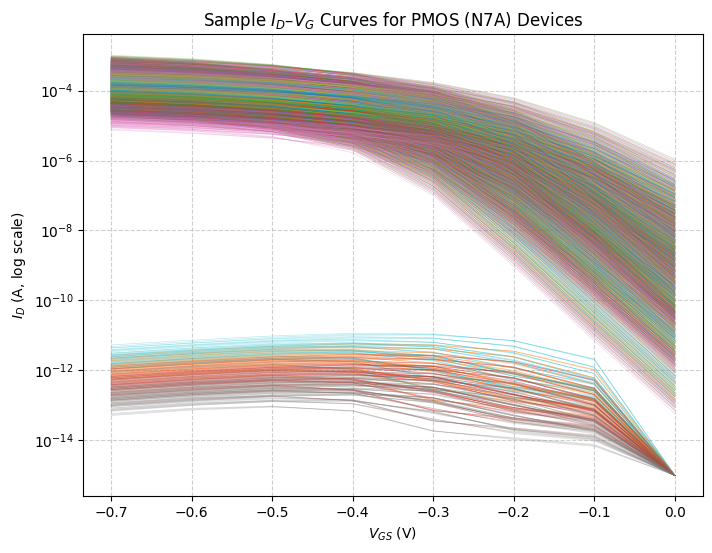

Plotting all 27000 raw samples for NMOS (N90A)...


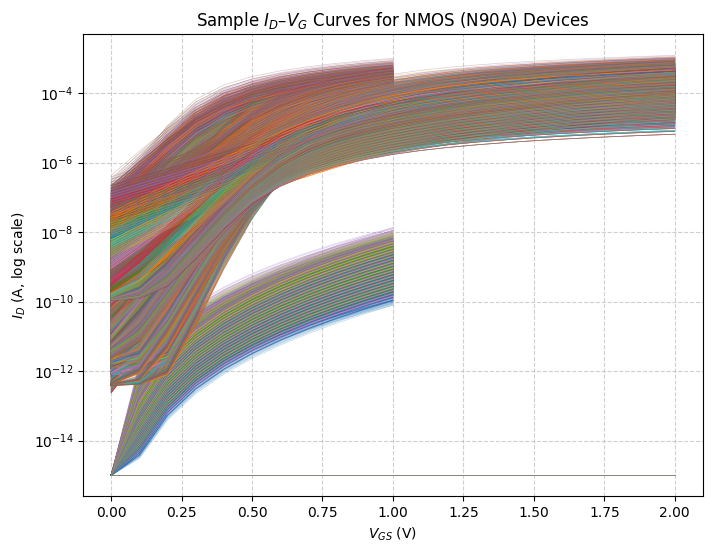

Plotting all 34500 raw samples for PMOS (N90A)...


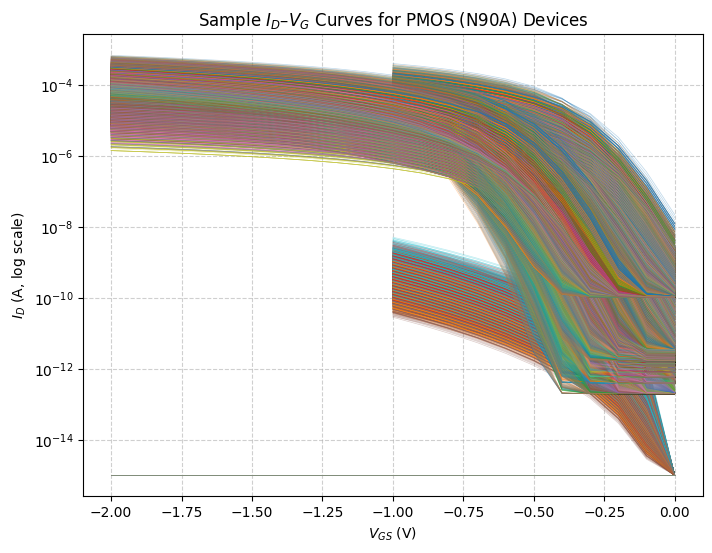

In [5]:
def plot_raw_curves_by_device(mesd_data):
  grouped_records = {}

  for device_data in mesd_data:
    device_type = device_data.get('Type')
    pdk = device_data.get('PDK')
    key = (device_type, pdk)

    # Add this file's records to the correct group
    if key not in grouped_records:
      grouped_records[key] = []

    records_list = device_data.get('Records')
    grouped_records[key].extend(records_list)

  print(f"Found {len(grouped_records)} device groups to plot.")

  for (device_type, pdk), records_list in grouped_records.items():
    plt.figure(figsize=(8, 6))

    print(f"Plotting all {len(records_list)} raw samples for {device_type} ({pdk})...")
    for record in records_list:
      vgs = np.array(record['Vgs'])
      ids = np.array(record['Ids'])


      # Plot in log scale
      plt.semilogy(vgs, np.abs(ids) + 1e-15, alpha=0.3, linewidth=0.5)


    plt.xlabel(r"$V_{GS}$ (V)")
    plt.ylabel(r"$I_D$ (A, log scale)")
    plt.title(f"Sample $I_D$–$V_G$ Curves for {device_type} ({pdk}) Devices")
    plt.grid(True, which="both", ls="--", alpha=0.6)
    plt.show()
plot_raw_curves_by_device(mesd_data)

## **Threshold Voltage Extraction Methods**

This function implements three different methods to extract the threshold voltage ($V_{th}$) from I-V curves:

### Method 1: Second Derivative (Default)
Finds the peak of the second derivative of $\log_{10}(I_D)$ with respect to $V_{GS}$:

$$\frac{d^2(\log_{10} I_D)}{dV_{GS}^2}$$

### Method 2: Constant Current
Finds $V_{GS}$ at a predefined current level (e.g., $10^{-7}$ A)

### Method 3: Y-Function
Extrapolates the linear region of the Y-function to find the x-intercept

In [6]:
def extract_threshold_voltage(vgs, ids, method='2nd_derivative'):
  if method == '2nd_derivative':
      # Calculate 2nd derivative of log(Ids) w.r.t Vgs
      log_ids = np.log10(np.abs(ids) + 1e-15)  # Adding small value to avoid log(0)
      first_deriv = np.gradient(log_ids, vgs)
      second_deriv = np.gradient(first_deriv, vgs)

      # Find peak of 2nd derivative
      peak_idx = np.argmax(second_deriv)
      return vgs[peak_idx]

  elif method == 'constant_current':
      # Find Vgs at predefined current level (e.g., 1e-7 A)
      target_current = 1e-7
      idx = np.argmin(np.abs(ids - target_current))
      return vgs[idx]

  elif method == 'y_function':
      # Y-function method implementation
      linear_region = y_func[len(y_func)//2:]
      vgs_linear = vgs[len(vgs)//2:]
      coeffs = np.polyfit(vgs_linear, linear_region, 1)
      vth = -coeffs[1] / coeffs[0]  # x-intercept
      return vth

## **Calculate Threshold Ratio ($R_{\text{th}}$)**

This function normalizes the threshold voltage to a ratio between 0 and 1 based on the $V_{\text{GS}}$ range.

**Formula:**

$$
R_{\text{th}} = \frac{V_{\text{th}} - V_{G,\text{min}}}{V_{G,\text{max}} - V_{G,\text{min}}}
$$

**Purpose:**
- Normalizes $V_{\text{th}}$ to a dimensionless value (0 to 1)
- Makes the target variable independent of the specific voltage range
- Improves ML model generalization across different device types
- Acts as the target variable (label) for supervised learning


In [7]:
def calculate_threshold_ratio(vgs, vth):
  vg_min, vg_max = min(vgs), max(vgs)
  rth = (vth - vg_min) / (vg_max - vg_min)
  return rth

## **Preprocess MESD Data for ML Training**

This function processes raw MESD dataset records into a structured format suitable for machine learning.

**Key Steps:**
1. **Extract device metadata** (Type, PDK) from each file
2. **Extract $V_{\text{th}}$** using the specified method (2nd derivative by default)
3. **Normalize I–V curves**:
   - $V_{\text{GS}}$ normalization: $\frac{V_{\text{GS}} - V_{G,\text{min}}}{V_{G,\text{max}} - V_{G,\text{min}}}$
   - $I_{\text{DS}}$ normalization: $\frac{I_{\text{DS}} - I_{\text{DS,min}}}{I_{\text{DS,max}} - I_{\text{DS,min}}}$
4. **Calculate threshold ratio ($R_{\text{th}}$)**
5. **Create feature vectors** from normalized $I_{\text{DS}}$ values

**Output:** List of dictionaries containing:
- `features`: Normalized I–V curve (array)
- `rth`: Threshold ratio target value ($R_{\text{th}}$)
- `metadata`: Device information
- `vgs_range`: $(V_{G,\text{min}}, V_{G,\text{max}})$ for inverse transformation


In [12]:
def preprocess_mesd_data(mesd_data, extraction_method='constant_current'):
  VG_NORMALIZED_AXIS_50 = np.linspace(0, 1, 50)
  MIN_ON_CURRENT = 1e-7

  processed_data = []

  for device_data in mesd_data:
      device_type = device_data['Type']
      pdk = device_data['PDK']

      for record in device_data['Records']:

          vgs = np.array(record['Vgs'])
          ids = np.array(record['Ids'])

          #Processes the data only for which the min on current is achieved
          if ((np.max(np.abs(ids)) > MIN_ON_CURRENT) and (np.min(np.abs(ids)) < MIN_ON_CURRENT)):
              pass
          else:
            continue

          # Extract threshold voltage
          try:
              vth = extract_threshold_voltage(vgs, ids, extraction_method)
              rth = calculate_threshold_ratio(vgs, vth)
              log_ids = np.log10(np.abs(ids)) # Converting to log scale
              # Normalize VG and interpolate Ids
              vgs_norm = (vgs - vgs.min()) / (vgs.max() - vgs.min())

              sort_indices = np.argsort(vgs_norm)
              vgs_norm_sorted = vgs_norm[sort_indices]
              log_ids_sorted = log_ids[sort_indices]


              log_ids_resampled = np.interp(VG_NORMALIZED_AXIS_50, vgs_norm_sorted, log_ids_sorted)
              min_log_id = log_ids_resampled.min()
              max_log_id = log_ids_resampled.max()

              ids_norm = (log_ids_resampled - min_log_id) / (max_log_id - min_log_id)
              features = ids_norm
              if (rth == 0.0) or (rth == 1.0): #Helps filter out flat lines
                continue

              processed_data.append({
                  'features': features,
                  'rth': rth,
                  'vth' : vth,
                  'device_type': device_type,
                  'pdk': pdk,
                  'vgs_range': (vgs.min(), vgs.max()),
                  'metadata': {
                      'temp': record.get('Temp', 25),
                      'vds': record.get('Vds', 0),
                      'w': record.get('W', 0),
                      'l': record.get('L', 0),
                      'nfin': record.get('Nfin', 1)
                  }
              })
          except Exception as e:
              print(f"Error processing record: {e}")
              continue

  return processed_data

processed_data = preprocess_mesd_data(mesd_data, extraction_method='constant_current')


## **Count Processed Records by Device**
Inspecting how many data samples exist for each MOSFET configuration after preprocessing.

Filtered out 157327 data samples. Either flat lines, or curves which didn't get into saturation.

In [16]:
def count_samples_by_device(processed_data):
  counts = {}
  n = 0
  p = 0

  for data in processed_data:
      # Create a unique key for each group
      key = (data['device_type'], data['pdk'])
      if key not in counts:
          counts[key] = 0
      counts[key] += 1
      if data['device_type'] == "NMOS" :
        n+=1
      else:
        p+=1

  if not counts:
      print("No processed data found.")
      return

  print("Sample Counts by Device")
  total_samples = 0
  for (device_type, pdk), count in counts.items():
      print(f"  - {device_type} ({pdk}): {count} samples")
      total_samples += count

  print("---------------------------------")
  print(f"  Total Processed Samples: {total_samples}")
  print(f"  Total NMOS Samples: {n}")
  print(f"  Total PMOS Samples: {p}")

count_samples_by_device(processed_data)

Sample Counts by Device
  - NMOS (N15A): 36 samples
  - PMOS (N15A): 32 samples
  - NMOS (N180A): 8225 samples
  - NMOS (N180B): 17795 samples
  - PMOS (N180B): 1592 samples
  - NMOS (N350A): 5385 samples
  - NMOS (N3A): 79 samples
  - PMOS (N3A): 121 samples
  - NMOS (N40A): 16613 samples
  - PMOS (N40A): 2444 samples
  - NMOS (N45A): 7312 samples
  - PMOS (N45A): 7305 samples
  - NMOS (N45B): 22500 samples
  - PMOS (N45B): 3466 samples
  - NMOS (N55A): 16631 samples
  - PMOS (N55A): 2713 samples
  - NMOS (N7A): 1144 samples
  - PMOS (N7A): 1129 samples
  - NMOS (N90A): 21762 samples
  - PMOS (N90A): 139 samples
---------------------------------
  Total Processed Samples: 136423
  Total NMOS Samples: 117482
  Total PMOS Samples: 18941


## **Create Feature Matrix with Consistent Dimensions**

This function prepares the processed data for ML by creating consistent-length feature vectors.

**Process:**
- Determines maximum feature length across all samples
- Pads shorter sequences with zeros to match max_length
- Truncates longer sequences to max_length
- Returns numpy arrays for X (features) and y (targets)


In [14]:
def create_feature_matrix(processed_data):
  X = []
  y = []
  metadata = []

  for data in processed_data:
      features = data['features']
      X.append(features)
      y.append(data['rth'])
      metadata.append(data['metadata'])

  return np.array(X), np.array(y), metadata

# Process the data
X, y, metadata = create_feature_matrix(processed_data)

print(f"Feature matrix shape: {X.shape}")
print(f"Target vector shape: {y.shape}")


Feature matrix shape: (136423, 50)
Target vector shape: (136423,)


## **Plot Normalized $I_D$–$V_G$ Curves by Device**

Visualization of plots of the **normalized drain current ($I_D$)** versus **normalized gate voltage ($V_G$)** characteristics for each device in the **processed data**.

Found 20 device groups to plot.
Plotting all 36 samples for NMOS (N15A)...


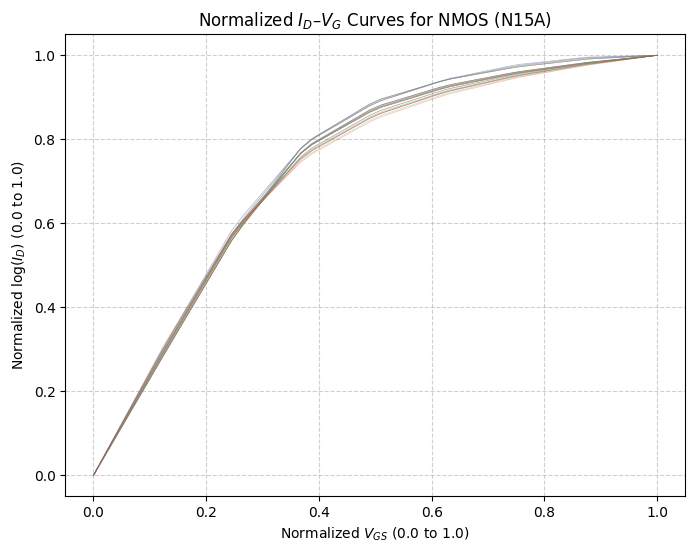

Plotting all 32 samples for PMOS (N15A)...


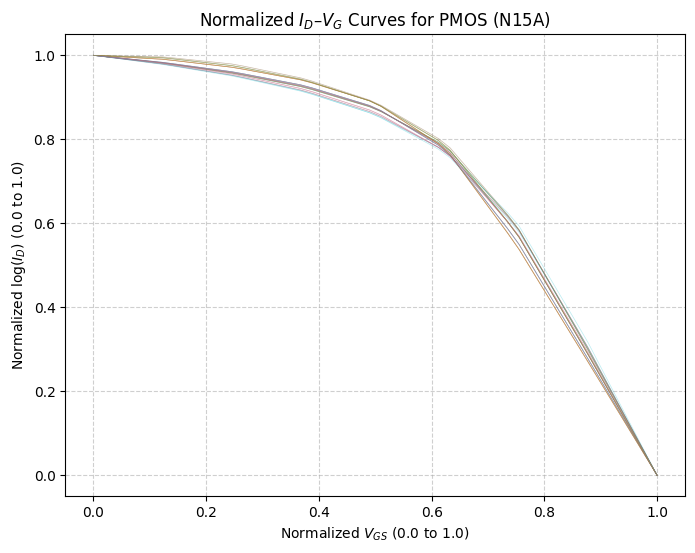

Plotting all 8225 samples for NMOS (N180A)...


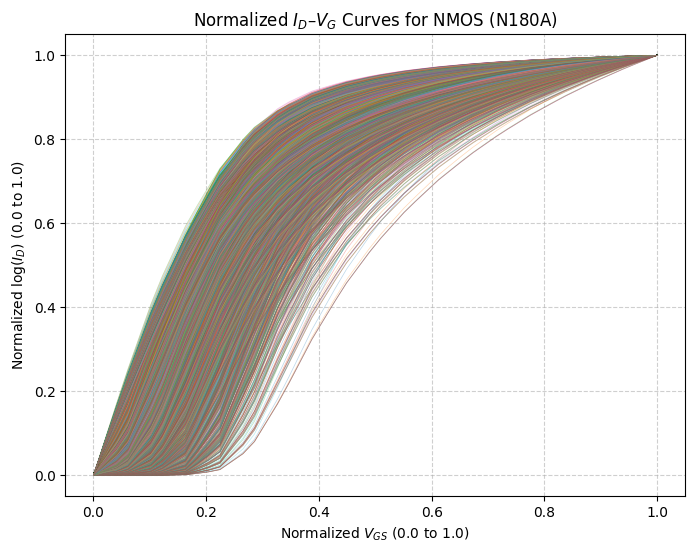

Plotting all 17795 samples for NMOS (N180B)...


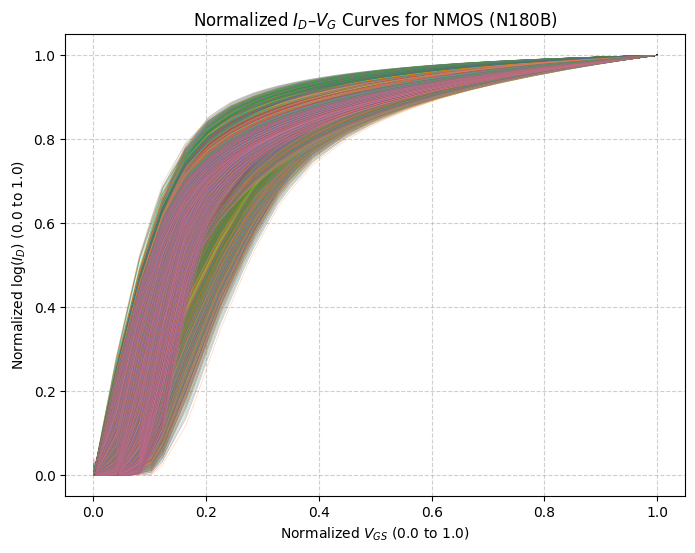

Plotting all 1592 samples for PMOS (N180B)...


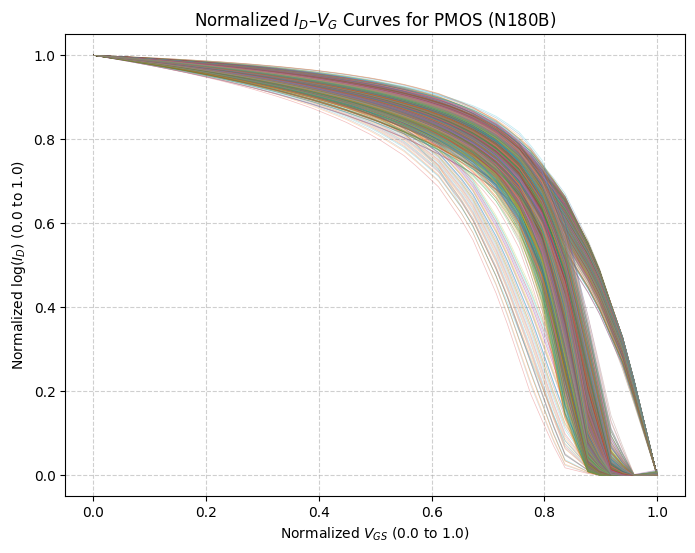

Plotting all 5385 samples for NMOS (N350A)...


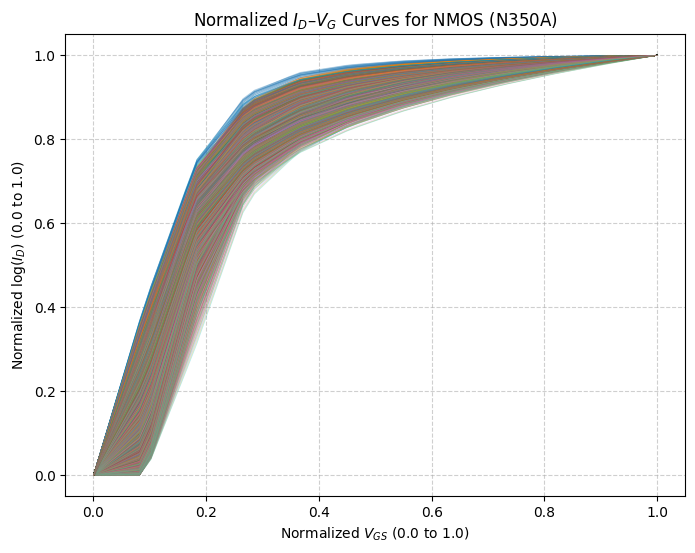

Plotting all 79 samples for NMOS (N3A)...


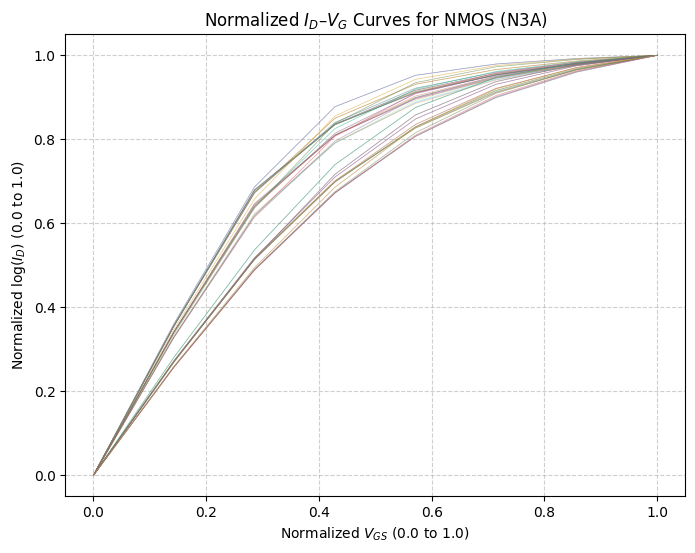

Plotting all 121 samples for PMOS (N3A)...


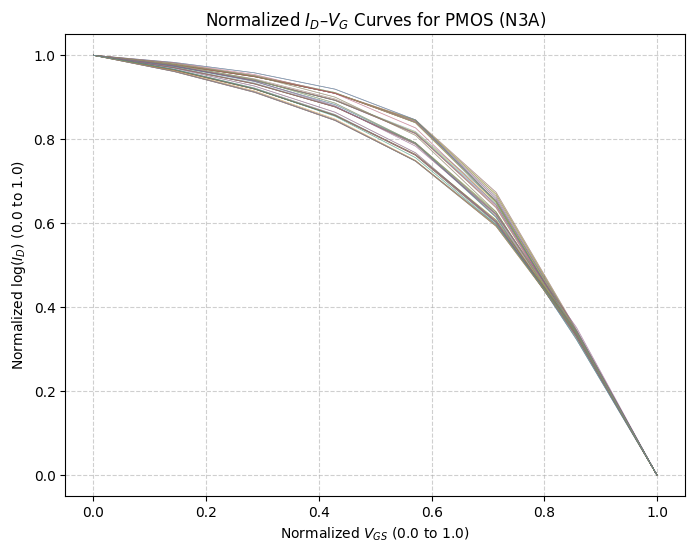

Plotting all 16613 samples for NMOS (N40A)...


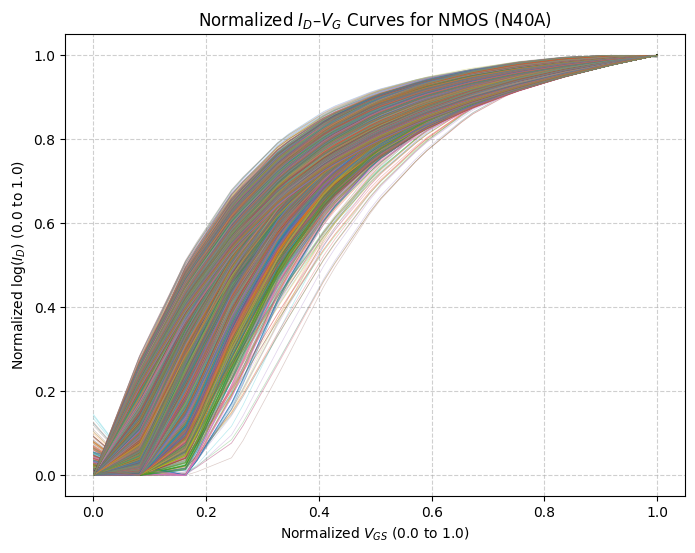

Plotting all 2444 samples for PMOS (N40A)...


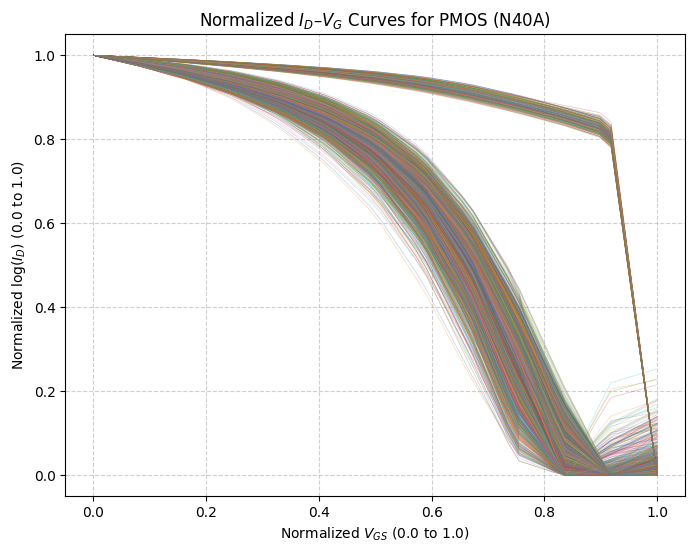

Plotting all 7312 samples for NMOS (N45A)...


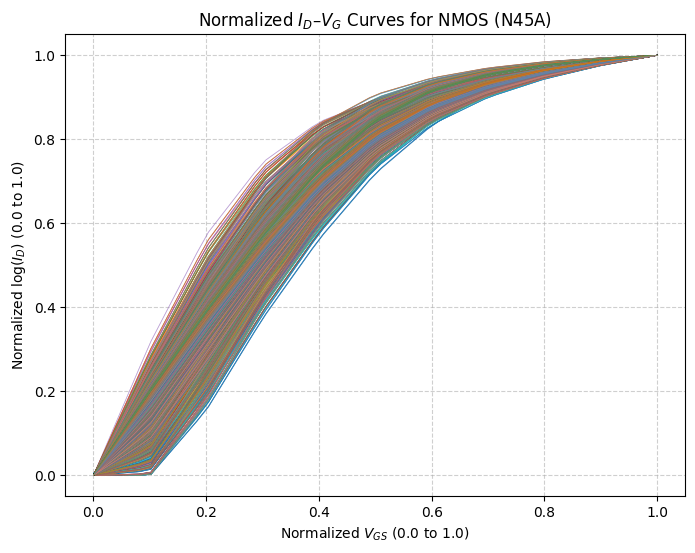

Plotting all 7305 samples for PMOS (N45A)...


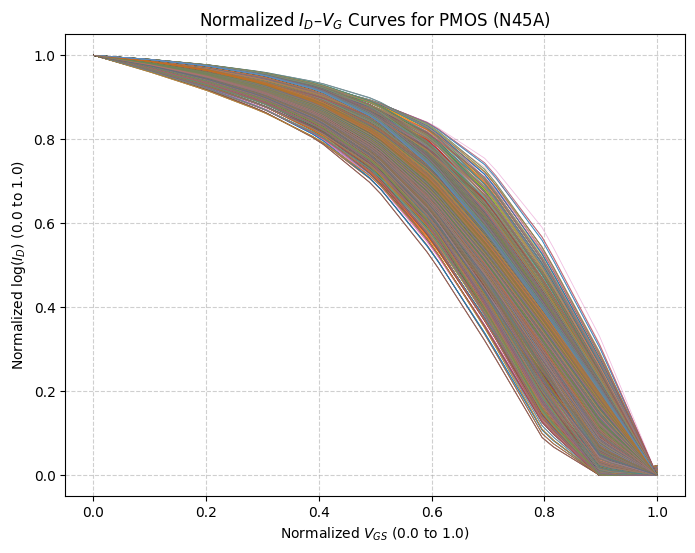

Plotting all 22500 samples for NMOS (N45B)...


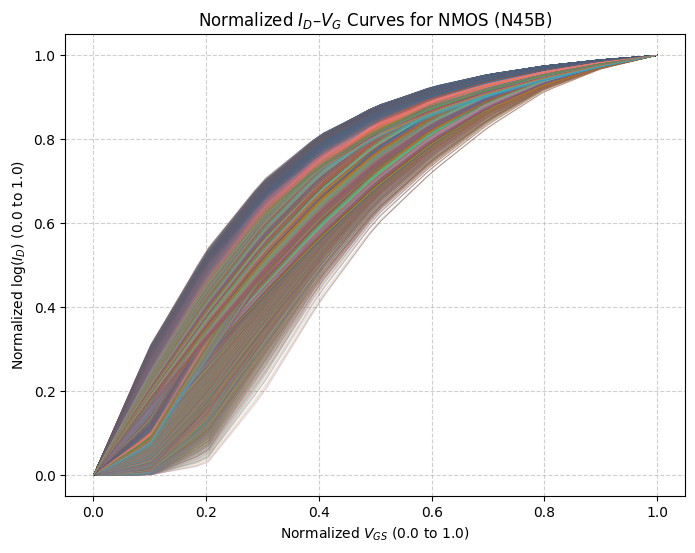

Plotting all 3466 samples for PMOS (N45B)...


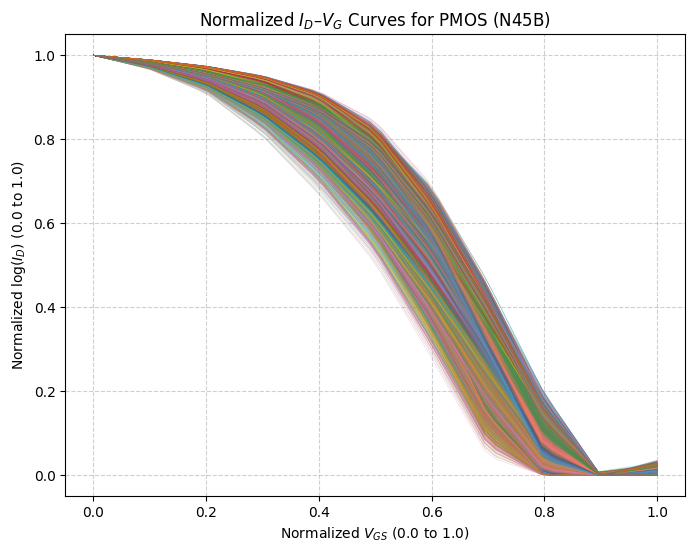

Plotting all 16631 samples for NMOS (N55A)...


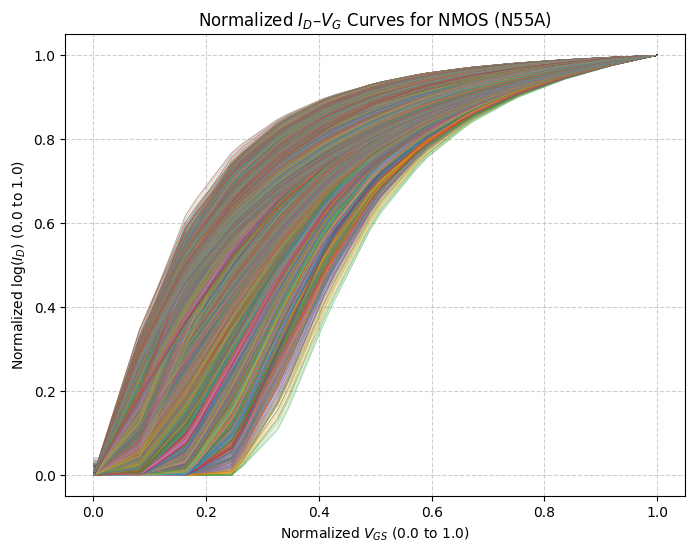

Plotting all 2713 samples for PMOS (N55A)...


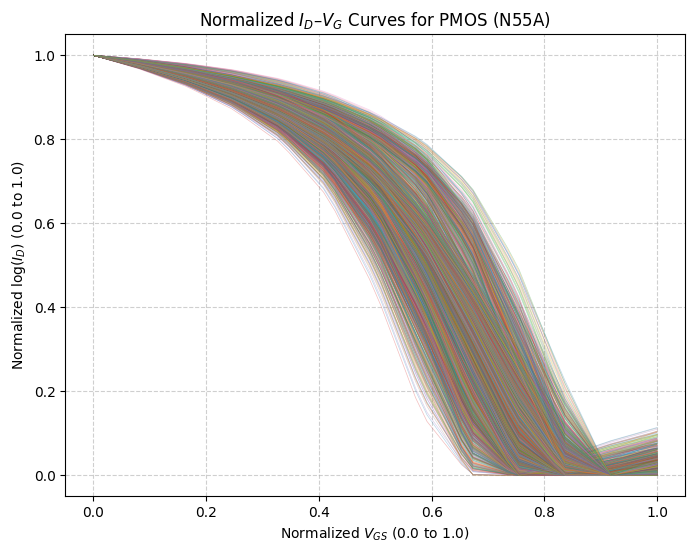

Plotting all 1144 samples for NMOS (N7A)...


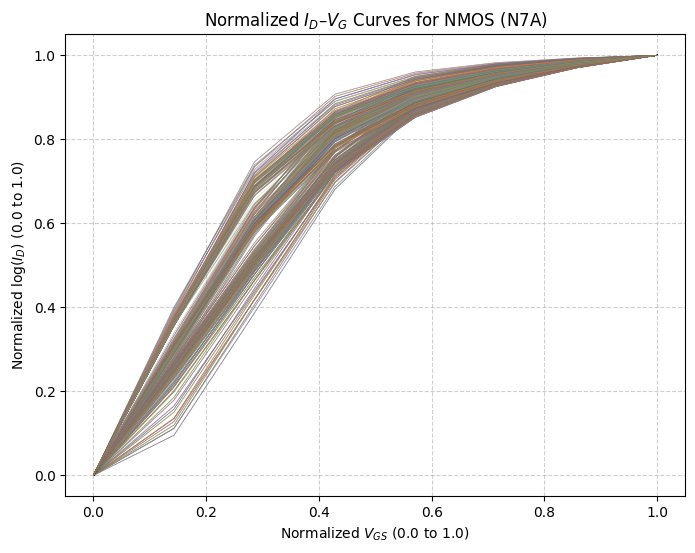

Plotting all 1129 samples for PMOS (N7A)...


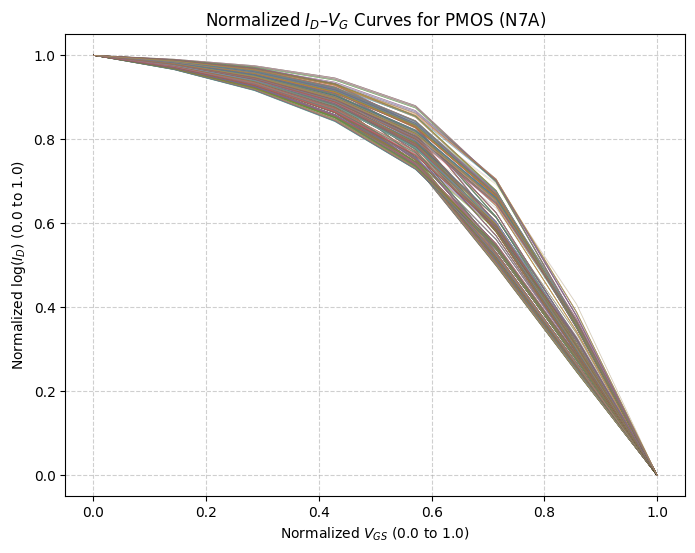

Plotting all 21762 samples for NMOS (N90A)...


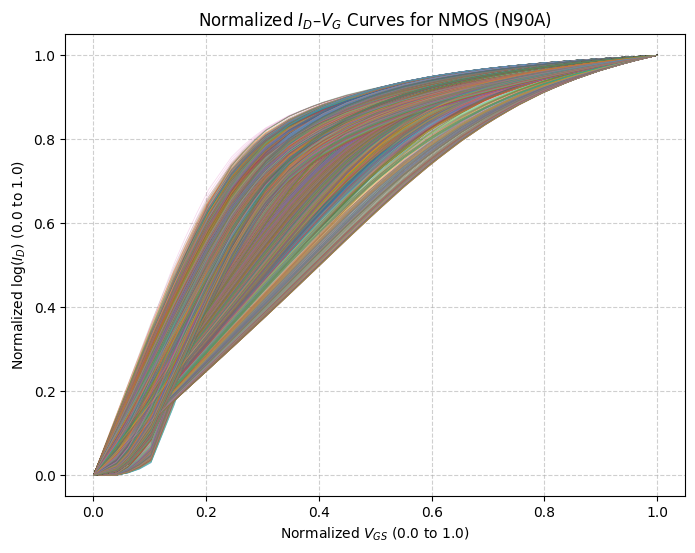

Plotting all 139 samples for PMOS (N90A)...


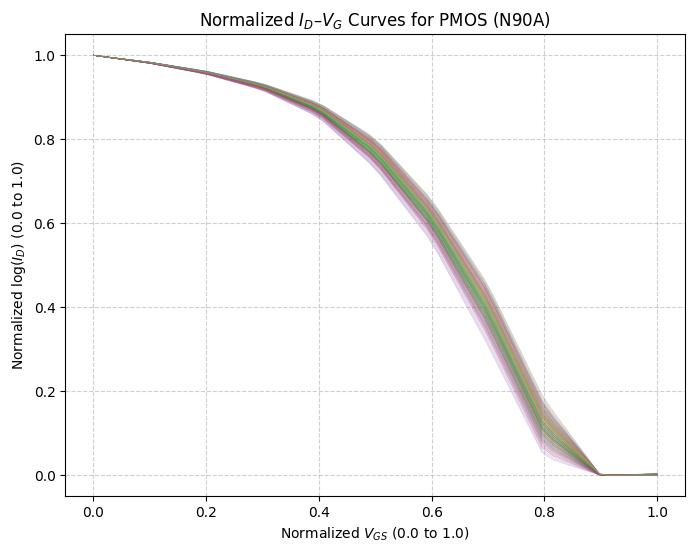

In [15]:
def plot_normalized_curves_by_device(processed_data):

    if not processed_data:
        print("No processed data to plot.")
        return

    grouped_data = {}
    for data in processed_data:
        key = (data['device_type'], data['pdk'])
        if key not in grouped_data:
            grouped_data[key] = []
        grouped_data[key].append(data)

    print(f"Found {len(grouped_data)} device groups to plot.")

    for (device_type, pdk), data_list in grouped_data.items():
        plt.figure(figsize=(8, 6))
        x_axis = np.linspace(0, 1, 50)
        print(f"Plotting all {len(data_list)} samples for {device_type} ({pdk})...")

        for data in data_list:
            ids_norm = data['features']

            # Plot the 50-point normalized curve
            plt.plot(x_axis, ids_norm, alpha=0.3, linewidth=0.5)

        plt.xlabel(r"Normalized $V_{GS}$ (0.0 to 1.0)")
        plt.ylabel(r"Normalized $\log(I_D)$ (0.0 to 1.0)")
        plt.title(f"Normalized $I_D$–$V_G$ Curves for {device_type} ({pdk})")
        plt.grid(True, ls="--", alpha=0.6)

        plt.show()
plot_normalized_curves_by_device(processed_data)